<!-- Copyright (c) 2021-2024, InterDigital Communications, Inc
All rights reserved.

Redistribution and use in source and binary forms, with or without 
modification, are permitted (subject to the limitations in the disclaimer 
below) provided that the following conditions are met:

* Redistributions of source code must retain the above copyright notice, 
this list of conditions and the following disclaimer.
* Redistributions in binary form must reproduce the above copyright notice, 
this list of conditions and the following disclaimer in the documentation 
and/or other materials provided with the distribution.
* Neither the name of InterDigital Communications, Inc nor the names of its 
contributors may be used to endorse or promote products derived from this 
software without specific prior written permission.

NO EXPRESS OR IMPLIED LICENSES TO ANY PARTY'S PATENT RIGHTS ARE GRANTED BY 
THIS LICENSE. THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND 
CONTRIBUTORS "AS IS" AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT 
NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A 
PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER 
OR CONTRIBUTORS BE LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, 
EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, 
PROCUREMENT OF SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; 
OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, 
WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR 
OTHERWISE) ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF 
ADVISED OF THE POSSIBILITY OF SUCH DAMAGE. -->

# CompressAI inference demo

In [18]:
import math
import io
import os
import torch
from torchvision import transforms
from torchvision.utils import save_image
import numpy as np
import time

from PIL import Image

import matplotlib.pyplot as plt

In [2]:
from pytorch_msssim import ms_ssim

In [3]:
from compressai.zoo import bmshj2018_factorized

In [4]:
from ipywidgets import interact, widgets

In [5]:
from skimage.metrics import structural_similarity as ssim

In [6]:
import cProfile

In [7]:
#pip install lpips
import lpips
loss_fn_alex=lpips.LPIPS(net="alex")
loss_fn_vgg=lpips.LPIPS(net="vgg")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressAIenv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressAIenv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressAIenv\Lib\site-packages\lpips\weights\v0.1\alex.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressAIenv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressAIenv\Lib\site-packages\lpips\weights\v0.1\vgg.pth


## Global settings

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


## Load a pretrained model

In [9]:
quality=8
metric="ms-ssim" #"mse"
model_name="bmshj2018_factorized"
net = bmshj2018_factorized(quality=quality,metric=metric, pretrained=True).eval().to(device)
print("Model encoder architecture")


Model encoder architecture


In [10]:
print(f'Encoder Parameters: {sum(p.numel() for p in net.parameters())}')

Encoder Parameters: 7030531


## 1. Inference

### Load image and convert to 4D float tensor

First, we need to load an RGB image and convert it to a 4D floating point tensor, as the network expectes an input tensor of size: `(batch_size, 3, height, width)`.

In [23]:
path=r'C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressai\examples\assets\drone.png'
img = Image.open(path).convert('RGB')
img.save("DIRECT_JPG.jpg",format="JPEG",quality=0)
disc=os.path.getsize(path)/1000
print("Size on disc:",disc,"kilobytes")
print(type(img))
image_data = img.copy()
# Get data size (number of elements)
# ... your code for loading and converting the image (lines 1-2)
image_data = np.array(img)  # Convert PIL image to NumPy array #1 byte for uint8 and 4 byte for float 32
data_size = image_data.size #number of elements in the numpy array
print("Numpy array data type:",image_data.dtype,"size of dtype:",image_data.dtype.itemsize,"bytes")
print("Number of elements",data_size,"shape:",image_data.shape)
size=data_size*image_data.dtype.itemsize
print("Image(numpy form:)",size/1000,"kb")
print("Image (png form)",disc,"kb")
#bits=image_data.dtype.itemsize
#print("bits:",bits)
#data_size_in_bytes = data_size * bits
#print(f"Image data size: {data_size} elements ({data_size_in_bytes/1000000} Mbytes)")
x = transforms.ToTensor()(img).unsqueeze(0).to(device)
print(type(x),x.size())
pixels=data_size
print("pixels:",pixels)
org_bpp=(disc*8000)/(pixels)
print("avg_bpp:",org_bpp)

Size on disc: 10157.311 kilobytes
<class 'PIL.Image.Image'>
Numpy array data type: uint8 size of dtype: 1 bytes
Number of elements 24245760 shape: (2464, 3280, 3)
Image(numpy form:) 24245.76 kb
Image (png form) 10157.311 kb
<class 'torch.Tensor'> torch.Size([1, 3, 2464, 3280])
pixels: 24245760
avg_bpp: 3.3514514702776896


In [12]:
%matplotlib inline
#plt.figure(figsize=(12, 9))
#plt.axis('off')
#plt.imshow(img)
#plt.show()

In [13]:
#import os
#print(os.getcwd())
#print(os.listdir())

### Run the network

In [26]:
import time 
start=time.time()
with torch.no_grad():
    out_net = net.forward(x)
out_net['x_hat'].clamp_(0, 1)
end=time.time()
print("Compression Time:",round(end-start,2))
print(out_net.keys())

Compression Time: 4.29
dict_keys(['x_hat', 'likelihoods'])


In [15]:
#understanding the output of the network
print("output:",type(out_net), out_net.keys())
keys=list(out_net.keys())
print(out_net[keys[0]].dtype)
print(out_net[keys[0]].itemsize)

print(type(out_net[keys[1]]))
tensor=out_net[keys[1]]['y']
print(type(tensor),tensor.shape,tensor.itemsize)


output: <class 'dict'> dict_keys(['x_hat', 'likelihoods'])
torch.float32
4
<class 'dict'>
<class 'torch.Tensor'> torch.Size([1, 320, 154, 205]) 4


We obtain a dictionary with the decoded/reconstructed image tensor `x_hat` and the latent(s) likelihoods.

### Visualize result

Convert the Tensor back to a 2D Pillow image:

In [16]:
rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu())
print(rec_net)
rec_net.save("drone_recon.webp","WEBP",quality=1)
rec_net.save("drone_recon.jpg","JPEG",quality=1)
print(os.getcwd())

<PIL.Image.Image image mode=RGB size=3280x2464 at 0x1DEADF47530>
C:\Swapnil\Narrowband_DRONE\Image_compression_code\Method_7_compress_ai\compressai\examples


In [19]:
#convert the image to grayscale then export
obj=out_net['x_hat']
from torchvision import transforms
g_scale_tensor=transforms.Grayscale()(obj)

save_image(g_scale_tensor,"g_torch_tensor.webp") #746KB
pil_image=Image.open("g_torch_tensor.webp").convert('L')
pil_image.save("g_torch_tensor_c.webp",quality=1) #154 KB
pil_image.save("g_torch_tensor_c.jpg",quality=1) #162 KB

#checking the ssim metric for the recon and the original image
def ssim_score(img_org,img_recon):
    img_org=np.asarray(Image.open(img_org))
    img_recon=np.asarray(Image.open(img_recon))

    ssim_value=ssim(img_org,img_recon,win_size=3)
    print("SSIM:",ssim_value)


    

In [32]:
pip install pillow-avif-plugin


Note: you may need to restart the kernel to use updated packages.


In [20]:
import pillow_avif
print("type of image:",type(out_net['x_hat']))
obj=out_net['x_hat']
print(obj.shape)
print(obj.itemsize)
print("size of each element:",obj.element_size(),"bytes")
print("Number of elements in the tensor:",obj.numel())
print("size of tensor on disc:",obj.numel()*obj.element_size()/1000,"kb")

#exporting this tensor
#torch.save(obj,"image_tensor.pt") #save to the file 94 MB file size

from torchvision.utils import save_image
save_image(obj,"torch_tensor_image.webp") #775 KB
save_image(obj,"torch_tensor_image.jpg") #1.04 MB

pil_img=Image.open("torch_tensor_image.webp")
pil_img.save("torch_tensor_image_c.webp",quality=1) #159 KB


#AVIF compression format
pil_img.save("torch_tensor_image_c.avif",format="AVIF",quality=5)
if hasattr(pil_img,'save_avif'):
    print("AVIF available")
else:
    print("No AVIF not available")

pil_img.save("torch_tensor_image_c.jpg",quality=1) #162 KB but the quality is very very bad

#exporting the image without the meta-data now
print(pil_img.info)
pil_img.info={}
pil_img.save("torch_tensor_image_meta_c.jpg",quality=1) #same 162 KB file size, no change

#comparison with the direct compression using the webp
pil_img_direct=Image.open(path)
pil_img_direct.save("torch_tensor_image_direct.webp",quality=1)#173 KB


#Trying to convert the tensor to the numpy array and then use the compression methods
#compress to numpy array
tensor=obj.cpu().numpy() #first converts the GPU to CPU then converts to the numpy array
print(type(tensor),tensor.size,tensor.shape)

#now using the methods to compress the array
#Method 1: using the numpy library method for compression
np.savez_compressed("numpy_image_tensor.npz",data=tensor) #78 MB file size

#Method 2: Using the h5py library for compressing the numpy array
import h5py
with h5py.File("image_tensor_h5py.hdf5","w") as f:
    #ceate a dataset with compression 
    dataset=f.create_dataset("data",data=tensor,compression="gzip") #75 MB file size

def calculate_psnr(img_org,img_recon):
    img_org=np.asarray(Image.open(img_org))
    img_recon=np.asarray(Image.open(img_recon))

    psnr_value=psnr(img_org,img_recon)
    print("PSNR:",psnr_value)

from skimage.metrics import peak_signal_noise_ratio as psnr

def calculate_lpips(img_org,img_recon):
    img_org=Image.open(img_org)
    img_recon=Image.open(img_recon)
    transform=transforms.ToTensor()
    img_org=transform(img_org)
    img_recon=transform(img_recon)
    print("LPIPS:",loss_fn_alex.forward(img_org,img_recon))  

def compression_ratio(img_1_path,img_2_path):
    """
        Assuming the first image is uncompressed version
    """
    try:
        size_1=os.path.getsize(img_1_path)
    except:
        print("img_1 path not valid")

    try:
        size_2=os.path.getsize(img_2_path)
    except:
        print("img_2 path not valid")

    ratio=size_1/size_2
    print("Compression ratio is:",ratio)

img_org=path
img_recon="torch_tensor_image_c.webp"
ssim_score(img_org,img_recon)
calculate_psnr(img_org,img_recon)
calculate_lpips(img_org,img_recon)
compression_ratio(img_org,img_recon)


img_recon="torch_tensor_image.webp"
ssim_score(img_org,img_recon)
calculate_psnr(img_org,img_recon)
calculate_lpips(img_org,img_recon)
compression_ratio(img_org,img_recon)


img_recon="torch_tensor_image_direct.webp"
ssim_score(img_org,img_recon)
calculate_psnr(img_org,img_recon)
calculate_lpips(img_org,img_recon)
compression_ratio(img_org,img_recon)

img_recon="torch_tensor_image_c.avif"
ssim_score(img_org,img_recon)
calculate_psnr(img_org,img_recon)
calculate_lpips(img_org,img_recon)
compression_ratio(img_org,img_recon)


type of image: <class 'torch.Tensor'>
torch.Size([1, 3, 2464, 3280])
4
size of each element: 4 bytes
Number of elements in the tensor: 24245760
size of tensor on disc: 96983.04 kb
No AVIF not available
{'loop': 1, 'background': (255, 255, 255, 255), 'timestamp': 0, 'duration': 0}
<class 'numpy.ndarray'> 24245760 (1, 3, 2464, 3280)
SSIM: 0.8043982347228738
PSNR: 27.525644792712104
LPIPS: tensor([[[[0.1597]]]], grad_fn=<AddBackward0>)
Compression ratio is: 62.304088868169885
SSIM: 0.9421840223826803
PSNR: 33.82244684851552
LPIPS: tensor([[[[0.0189]]]], grad_fn=<AddBackward0>)
Compression ratio is: 12.790070212905274
SSIM: 0.8236865562114075
PSNR: 28.244907899482467
LPIPS: tensor([[[[0.1332]]]], grad_fn=<AddBackward0>)
Compression ratio is: 57.218484886039725
SSIM: 0.714949476834159
PSNR: 25.49885435318728
LPIPS: tensor([[[[0.2601]]]], grad_fn=<AddBackward0>)
Compression ratio is: 156.32163688689843


In [21]:
print(type(img_org),type(img_recon))
transform=transforms.ToTensor()
img_org=transform(img_org)
img_recon=transform(img_recon)
print("LPIPS:",loss_fn_alex.forward(img_org,img_recon))

<class 'str'> <class 'str'>


TypeError: pic should be PIL Image or ndarray. Got <class 'str'>

In [ ]:
#New compress function with two way compression 
webp_c_time=0
dest_path="something"
img_type="something"
img_size=0
dataset_size=0
export_format=[".jpg",".webp"]
def compress_new(path,webp_c_time,dest_path,img_type,img_size,dataset_size):
    """
        first the image is saved as torchvision.utils.save_img function 
        then the already compressed image is imported and further compressed
    """
    start=time.time()
    export_path=path+"\\"+"compressed_output_jupyter_4"
    des_path=export_path

    try:
        os.mkdir(export_path)
    except:
        print("Already exists")
    os.chdir(path)
    print("we are in:",os.getcwd())
    files=os.listdir()
    export_path_w=export_path+"\\WEBP"
    try:
        os.mkdir(export_path_w)
    except:
        print("Already exists")

    images=[] #only capturing the .png or .jpg images
    for file in files:
        if ".jpg" in file or ".jpeg" in file or ".png" in file or ".PNG" in file:
            images.append(file)
    print("Number of images found:",len(images))
    dataset_size=len(images)
    print("Type of image found",images[0][-4:])
    img_type=images[0][-4:]
    image_first_size=os.path.getsize(path+"\\"+images[0])
    print("Size of one image:",image_first_size/1000,"KB")
    img_size=image_first_size
    
    
    print("Doing for WEBP")
    for img in images:
        print("Img:",img)
        image = Image.open(img).convert('RGB')
        x = transforms.ToTensor()(image).unsqueeze(0).to(device)
        #print(type(x))
        with torch.no_grad():
            out_net=net.forward(x)
        out_net['x_hat'].clamp(0,1)
        obj=out_net['x_hat']
        file=img[:-4]+".webp"
        save_image(obj,file)
        #now read the images
        img=Image.open(file)
        #file_name=export_path_w+"\\"
        file+=file[:-5]+"_c"
        img.save(file+".webp","WEBP",quality=10)
    print("Done for WEBP")
    end=time.time() #end time for the compression of the WEBP
    webp_c_time=end-start
    return webp_c_time,dest_path,img_type,img_size,dataset_size
#path=r"C:\Swapnil\Narrowband_DRONE\Datasets\3_fpv_direct_20m_dynamic_3280_color"
path=r"C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images"
src_path=path
webp_c_time,dest_path,img_type,img_size,dataset_size=compress_new(path,webp_c_time,dest_path,img_type,img_size,dataset_size)
compression_time=webp_c_time

In [42]:
#code for the dataset
#one image at a time
webp_c_time=0
dest_path="something"
img_type="something"
img_size=0
dataset_size=0
export_format=[".jpg",".webp"]
def compress(path,webp_c_time,dest_path,img_type,img_size,dataset_size):
    start=time.time() #starting the time for the compression
    export_path=path+"\\"+"compressed_output_jupyter_3"
    dest_path=export_path #updating the destination path dest_path
    try:
        os.mkdir(export_path)
    except:
        print("Already exists")
    os.chdir(path)
    print("Now we are in:",os.getcwd())
    files=os.listdir()
    export_path_w=export_path+"\\WEBP"
    try:
        os.mkdir(export_path_w)
    except:
        print("Path already exists")

   

    images=[] #only capturing the .png or .jpg images
    for file in files:
        if ".jpg" in file or ".jpeg" in file or ".png" in file or ".PNG" in file:
            images.append(file)
    print("Number of images found:",len(images))
    dataset_size=len(images)
    print("Type of image found",images[0][-4:])
    img_type=images[0][-4:]
    image_first_size=os.path.getsize(path+"\\"+images[0])
    print("Size of one image:",image_first_size/1000,"KB")
    img_size=image_first_size
    
    
    print("Doing for WEBP")
    for img in images:
        print("Img:",img)
        image = Image.open(img).convert('RGB')
        x = transforms.ToTensor()(image).unsqueeze(0).to(device)
        #print(type(x))
        with torch.no_grad():
            out_net=net.forward(x)
        out_net['x_hat'].clamp(0,1)
        rec_net=transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu())
        file_name=export_path_w+"\\"
        file_name+=img[:-4]+"_c"
        rec_net.save(file_name+".webp","WEBP",quality=10)
    print("Done for WEBP")
    end=time.time() #end time for the compression of the WEBP
    webp_c_time=end-start
    
            
    export_path_j=export_path+"\\JPG"

    try:
        os.mkdir(export_path_j)
    except:
        print("Path already exists")

    print("Doing for JPG")
    for img in images:
        print("Img:",img)
        image = Image.open(img).convert('RGB')
        x = transforms.ToTensor()(image).unsqueeze(0).to(device)
        #print(type(x))
        with torch.no_grad():
            out_net=net.forward(x)
        out_net['x_hat'].clamp(0,1)
        rec_net=transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu())
        file_name=export_path_j+"\\"
        file_name+=img[:-4]+"_c"
        rec_net.save(file_name+".jpg","JPEG",quality=20)

    print("Done for JPEG")
    return webp_c_time,dest_path,img_type,img_size,dataset_size
#path=r"C:\Swapnil\Narrowband_DRONE\Datasets\3_fpv_direct_20m_dynamic_3280_color"
path=r"C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images"
src_path=path
webp_c_time,dest_path,img_type,img_size,dataset_size=compress(path,webp_c_time,dest_path,img_type,img_size,dataset_size)
compression_time=webp_c_time

Already exists
Now we are in: C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images
Path already exists
Number of images found: 105
Type of image found .jpg
Size of one image: 845.767 KB
Doing for WEBP
Img: 0300.jpg
Img: 0301.jpg
Img: 0302.jpg
Img: 0303.jpg
Img: 0304.jpg
Img: 0305.jpg
Img: 0306.jpg
Img: 0307.jpg
Img: 0308.jpg
Img: 0309.jpg
Img: 0310.jpg
Img: 0311.jpg
Img: 0312.jpg
Img: 0313.jpg
Img: 0314.jpg
Img: 0315.jpg
Img: 0316.jpg
Img: 0317.jpg
Img: 0318.jpg
Img: 0319.jpg
Img: 0320.jpg
Img: 0321.jpg
Img: 0322.jpg
Img: 0323.jpg
Img: 0324.jpg
Img: 0325.jpg
Img: 0326.jpg
Img: 0327.jpg
Img: 0328.jpg
Img: 0329.jpg
Img: 0330.jpg
Img: 0331.jpg
Img: 0332.jpg
Img: 0333.jpg
Img: 0334.jpg
Img: 0335.jpg
Img: 0336.jpg
Img: 0337.jpg
Img: 0338.jpg
Img: 0339.jpg
Img: 0340.jpg
Img: 0341.jpg
Img: 0342.jpg
Img: 0343.jpg
Img: 0344.jpg
Img: 0345.jpg
Img: 0346.jpg
Img: 0347.jpg
Img: 0348.jpg
Img: 0349.jpg
Img: 0350.jpg
Img: 0351.jpg
Img: 0352.jpg
Img: 0353.jpg
Img: 0354.jpg
Img: 0355.j

KeyboardInterrupt: 

In [67]:
#exporting the test file about the model and the dataset

details={}
details["model_name"]=model_name
details["metric"]=metric
details["quality"]=quality

details["dataset_image_type"]=img_type
details["dataset_image_size"]=img_size
details["dataset_size"]=dataset_size
details["export_type"]=export_format
details["comp_time"]=compression_time
details["data_src_path"]=src_path
details["data_dest_path"]=dest_path

print("detials of the compression process:")
print(details)

#exporting the details dictionary to the text file
org_path=os.getcwd()
os.chdir(dest_path) #move to the desitnation path
with open("Experiment_details_dict.txt","w") as f:
    f.write("\n")
    f.write("\n")
    f.write("DLL Model Details")
    f.write("\n")
    f.write("\n")
    f.write(f"model name: {details["model_name"]}")
    f.write("\n")
    f.write(f"model metric used: {details["metric"]}")
    f.write("\n")
    f.write(f"model quality level: {details["quality"]}")
    f.write("\n")
    f.write("\n")
    f.write("DATA SET DETAILS")
    f.write("\n")
    f.write("\n")
    f.write(f"dataset image type: {details["dataset_image_type"]}")
    f.write("\n")
    f.write(f"dataset image size (single image in bytes): {details["dataset_image_size"]}")
    f.write("\n")
    f.write(f"dataset size (number of images): {details["dataset_size"]}")
    f.write("\n")
    f.write(f"export image format: {details["export_type"]}")
    f.write("\n")
    f.write(f"compression time for webp dataset: {details["comp_time"]}")
    f.write("\n")
    f.write(f"dataset source path: {details["data_src_path"]}")
    f.write("\n")
    f.write(f"dataset destination path: {details["data_dest_path"]}")
    f.write("\n")
    
    
#move back to the org_path
os.chdir(org_path)

detials of the compression process:
{'model_name': 'bmshj2018_factorized', 'metric': 'ms-ssim', 'quality': 8, 'dataset_image_type': '.jpg', 'dataset_image_size': 845767, 'dataset_size': 101, 'export_type': ['.jpg', '.webp'], 'comp_time': 33.294453620910645, 'data_src_path': 'C:\\Swapnil\\Narrowband_DRONE\\Drone_artificial_dataset_experiment\\images', 'data_dest_path': 'C:\\Swapnil\\Narrowband_DRONE\\Drone_artificial_dataset_experiment\\images\\compressed_output_jupyter_3'}


In [53]:
#directly compressing the images using the traditional codecs such as JPEG and WEBP
path=r"C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images" #where the uncompressed files are kept
#compress the images
org_path=os.getcwd()
print("We are in:",org_path)

new_path=path

#change the path 
os.chdir(new_path)

files=os.listdir()
images=[]

for file in files:
    if ".jpg" in file or ".JPG" in file or ".png" in file or ".PNG" in file:
        images.append(file)

export_path=new_path+"\\"+"WEBP_PIL"
print("Found:",len(files),"files in the directory")
#open the image using the PIL 
 #saving the loaded file in the 
try:
    os.mkdir(export_path)
except:
    print("path already exists")
for img in images:
    try:
        image=Image.open(img)
    except:
        print("File:",img,"not opended")

   
    file_name=export_path+"\\"+img[:-4]
    print(file_name)
    image.save(file_name+".webp",format="WEBP",quality=10) #setting the quality to be 10

print("Exporting done for the files")
print("Now going back to the initial directory")

os.chdir(org_path)
print("We are in:",os.getcwd())
        

    
    
    
    

We are in: C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images
Found: 105 files in the directory
path already exists
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0300
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0301
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0302
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0303
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0304
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0305
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0306
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0307
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0308
C:\Swapnil\Narrowband_DRONE\Drone_artificial_dataset_experiment\images\WEBP_PIL\0309
C:\Swapnil\Nar

KeyboardInterrupt: 

In [ ]:
cwd=os.getcwd()
path=os.path.join(cwd,"compressed_output_jupyter")
#os.chdir(path)
print(os.getcwd())
webp=[]
jpg=[]
files=os.listdir()
for file in files:
    if ".webp" in file:
        webp.append(file)
    elif ".jpg" in file:
        jpg.append(file)
print(len(jpg))
print(len(webp))
#make new directory
print(os.getcwd())

try:
    os.makedirs("JPG")
except:
    print("already present")

try:
    os.makedirs("WEBP")
except:
    print("already present")

#move the files from current directory to respective of the JPG and WEBP

jpg_src=os.getcwd()+"\\"
jpg_dest=os.getcwd()+"\\"+"JPG"+"\\"
for file in jpg:
    print(file)
    src=jpg_src+file
    dest=jpg_dest+file
    os.rename(src,dest)


webp_src=os.getcwd()+"\\"
webp_dest=os.getcwd()+"\\"+"WEBP"+"\\"
for file in webp:
    src=webp_src+file
    dest=webp_dest+file
    os.rename(src,dest)

In [48]:
diff = torch.mean((out_net['x_hat'] - x).abs(), axis=1).squeeze().cpu()

print(diff)

tensor([[0.0322, 0.0323, 0.0239,  ..., 0.0023, 0.0050, 0.0090],
        [0.0340, 0.0325, 0.0248,  ..., 0.0067, 0.0069, 0.0077],
        [0.0256, 0.0243, 0.0206,  ..., 0.0047, 0.0056, 0.0078],
        ...,
        [0.0092, 0.0087, 0.0066,  ..., 0.0294, 0.0303, 0.0271],
        [0.0090, 0.0067, 0.0044,  ..., 0.0402, 0.0400, 0.0273],
        [0.0094, 0.0047, 0.0039,  ..., 0.0225, 0.0207, 0.0137]])


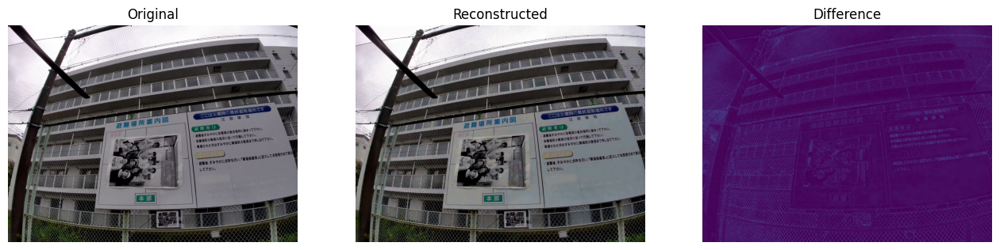

In [49]:
%matplotlib inline
fix, axes = plt.subplots(1, 3, figsize=(16, 12))
for ax in axes:
    ax.axis('off')
    
axes[0].imshow(img)
axes[0].title.set_text('Original')

axes[1].imshow(rec_net)
axes[1].title.set_text('Reconstructed')

axes[2].imshow(diff, cmap='viridis')
axes[2].title.set_text('Difference')

plt.show()

### Compute metrics

Now, let's compute some common metrics...

In [50]:
def compute_psnr(a, b):
    mse = torch.mean((a - b)**2).item()
    return -10 * math.log10(mse)

def compute_msssim(a, b):
    return ms_ssim(a, b, data_range=1.).item()

def compute_bpp(out_net):
    size = out_net['x_hat'].size()
    num_pixels = size[0] * size[2] * size[3]
    return sum(torch.log(likelihoods).sum() / (-math.log(2) * num_pixels)
              for likelihoods in out_net['likelihoods'].values()).item()

In [51]:
print(f'PSNR: {compute_psnr(x, out_net["x_hat"]):.2f}dB')
print(f'MS-SSIM: {compute_msssim(x, out_net["x_hat"]):.4f}')
print(f'Bit-rate: {compute_bpp(out_net):.3f} bpp')

PSNR: 28.20dB
MS-SSIM: 0.9528
Bit-rate: 0.139 bpp


## 2. Comparison to classical codecs

Let's perform some comparison against JPEG and WebP as they are included in the Pillow library.

In [52]:
def pillow_encode(img, fmt='jpeg', quality=10):
    tmp = io.BytesIO()
    img.save(tmp, format=fmt, quality=quality)
    tmp.seek(0)
    filesize = tmp.getbuffer().nbytes
    bpp = filesize * float(8) / (img.size[0] * img.size[1])
    rec = Image.open(tmp)
    return rec, bpp

In [53]:
from functools import partial

In [59]:
def find_closest_bpp(target, img, fmt='jpeg'):
    lower = 0
    upper = 100
    prev_mid = upper
    for i in range(10):
        mid = (upper - lower) / 2 + lower
        print(mid)
        if int(mid) == int(prev_mid):
            print("break",mid)
            break
        rec, bpp = pillow_encode(img, fmt=fmt, quality=int(mid))
        print("find closest bpp function:","bpp,mid",bpp,mid)
        if bpp > target:
            upper = mid - 1
        else:
            lower = mid
    print("final quality:",mid)
    return rec, bpp

def find_closest_psnr(target, img, fmt='jpeg'):
    lower = 0
    upper = 100
    prev_mid = upper
    
    def _psnr(a, b):
        a = np.asarray(a).astype(np.float32)
        b = np.asarray(b).astype(np.float32)
        mse = np.mean(np.square(a - b))
        return 20*math.log10(255.) -10. * math.log10(mse)
    
    for i in range(10):
        mid = (upper - lower) / 2 + lower
        if int(mid) == int(prev_mid):
            break
        prev_mid = mid
        rec, bpp = pillow_encode(img, fmt=fmt, quality=int(mid))
        psnr_val = _psnr(rec, img)
        if psnr_val > target:
            upper = mid - 1
        else:
            lower = mid
    return rec, bpp, psnr_val

def find_closest_msssim(target, img, fmt='jpeg'):
    lower = 0
    upper = 100
    prev_mid = upper
    
    def _mssim(a, b):
        a = torch.from_numpy(np.asarray(a).astype(np.float32)).permute(2, 0, 1).unsqueeze(0)
        b = torch.from_numpy(np.asarray(b).astype(np.float32)).permute(2, 0, 1).unsqueeze(0)
        return ms_ssim(a, b, data_range=255.).item()

    for i in range(10):
        mid = (upper - lower) / 2 + lower
        if int(mid) == int(prev_mid):
            break
        prev_mid = mid
        rec, bpp = pillow_encode(img, fmt=fmt, quality=int(mid))
        msssim_val = _mssim(rec, img)
        if msssim_val > target:
            upper = mid - 1
        else:
            lower = mid
    return rec, bpp, msssim_val

### 2.1 Quality comparison at similar bit-rate

In [61]:
target_bpp = compute_bpp(out_net)
rec_jpeg, bpp_jpeg = find_closest_bpp(target_bpp, img)
rec_webp, bpp_webp = find_closest_bpp(target_bpp, img, fmt='webp')

50.0
find closest bpp function: bpp,mid 0.7861914000633513 50.0
24.5
find closest bpp function: bpp,mid 0.5468512432689262 24.5
11.75
find closest bpp function: bpp,mid 0.3575853262591068 11.75
5.375
find closest bpp function: bpp,mid 0.22711434906556857 5.375
2.1875
find closest bpp function: bpp,mid 0.16647331327209375 2.1875
0.59375
find closest bpp function: bpp,mid 0.1663673978460564 0.59375
-0.203125
find closest bpp function: bpp,mid 0.1663673978460564 -0.203125
-0.6015625
find closest bpp function: bpp,mid 0.1663673978460564 -0.6015625
-0.80078125
find closest bpp function: bpp,mid 0.1663673978460564 -0.80078125
-0.900390625
find closest bpp function: bpp,mid 0.1663673978460564 -0.900390625
final quality: -0.900390625
50.0
find closest bpp function: bpp,mid 0.5283853341780171 50.0
24.5
find closest bpp function: bpp,mid 0.38360983528666454 24.5
11.75
find closest bpp function: bpp,mid 0.29740853658536587 11.75
5.375
find closest bpp function: bpp,mid 0.23671404814697497 5.375
2

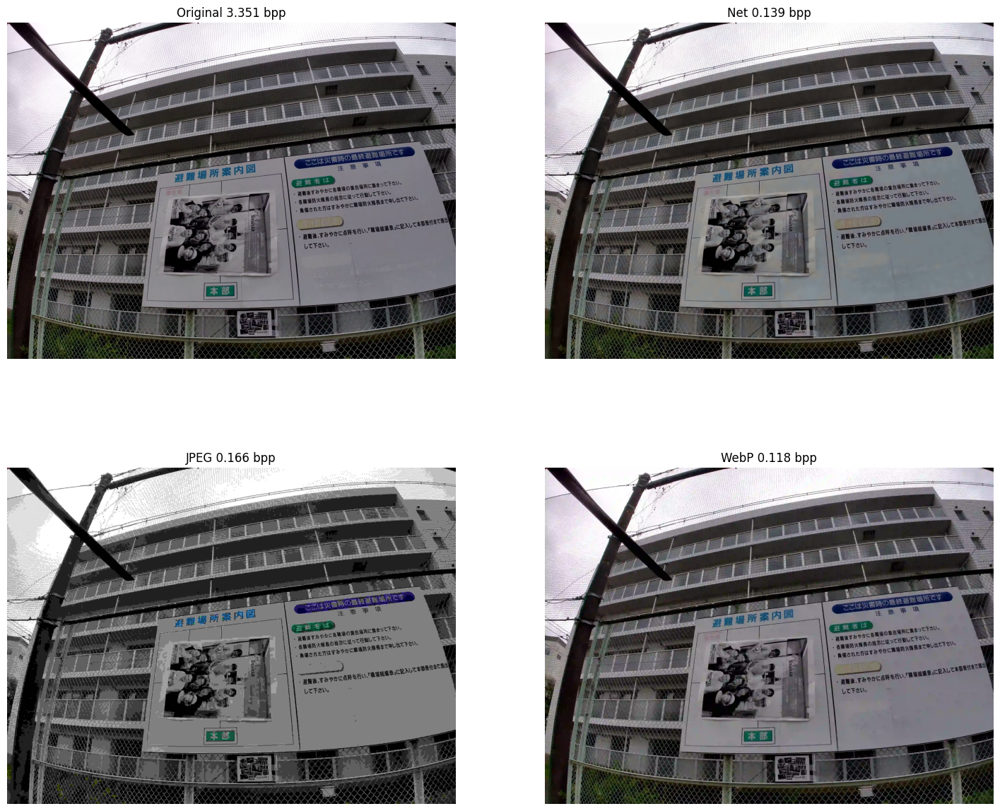

In [62]:
fig, axes = plt.subplots(2, 2, figsize=(18, 15))
for ax in axes.ravel():
    ax.axis('off')

fig.title = 'yolo'
axes[0][0].imshow(img)
axes[0][0].title.set_text(f'Original {org_bpp:.3f} bpp')
axes[0][1].imshow(rec_net)
axes[0][1].title.set_text(f'Net {target_bpp:.3f} bpp')
axes[1][0].imshow(rec_jpeg)
axes[1][0].title.set_text(f'JPEG {bpp_jpeg:.3f} bpp')
axes[1][1].imshow(rec_webp)
axes[1][1].title.set_text(f'WebP {bpp_webp:.3f} bpp')

plt.show()

### 2.2 Bit-rate comparison at similar PSNR

In [63]:
target_psnr = compute_psnr(x, out_net["x_hat"])
rec_jpeg, bpp_jpeg, psnr_jpeg = find_closest_psnr(target_psnr, img)
rec_webp, bpp_webp, psnr_webp = find_closest_psnr(target_psnr, img, fmt='webp')

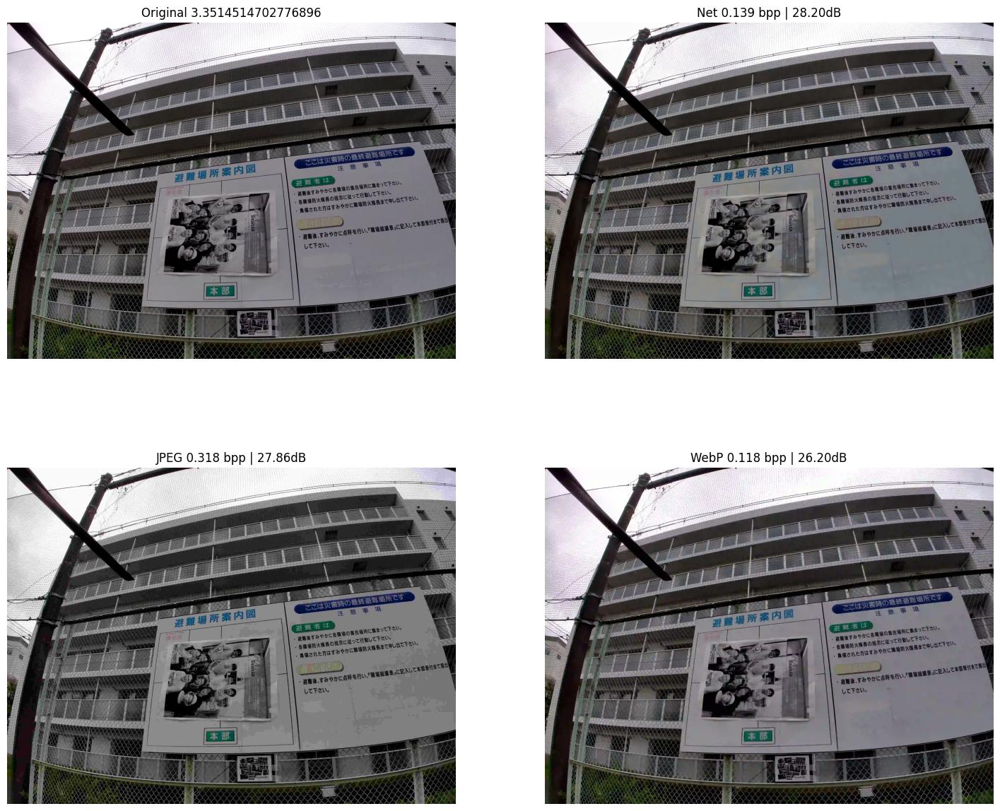

In [64]:
fig, axes = plt.subplots(2, 2, figsize=(18, 15))
for ax in axes.ravel():
    ax.axis('off')
    
axes[0][0].imshow(img)
axes[0][0].title.set_text(f'Original {org_bpp}')
axes[0][1].imshow(rec_net)
axes[0][1].title.set_text(f'Net {target_bpp:.3f} bpp | {target_psnr:.2f}dB')
axes[1][0].imshow(rec_jpeg)
axes[1][0].title.set_text(f'JPEG {bpp_jpeg:.3f} bpp | {psnr_jpeg:.2f}dB')
axes[1][1].imshow(rec_webp)
axes[1][1].title.set_text(f'WebP {bpp_webp:.3f} bpp | {psnr_webp:.2f}dB')

plt.show()

### 2.3) Bit-rate comparison at similar MS-SSIM

In [65]:
target_msssim = compute_msssim(x, out_net["x_hat"])
rec_jpeg, bpp_jpeg, msssim_jpeg = find_closest_msssim(target_msssim, img)
rec_webp, bpp_webp, msssim_webp = find_closest_msssim(target_msssim, img, fmt='webp')

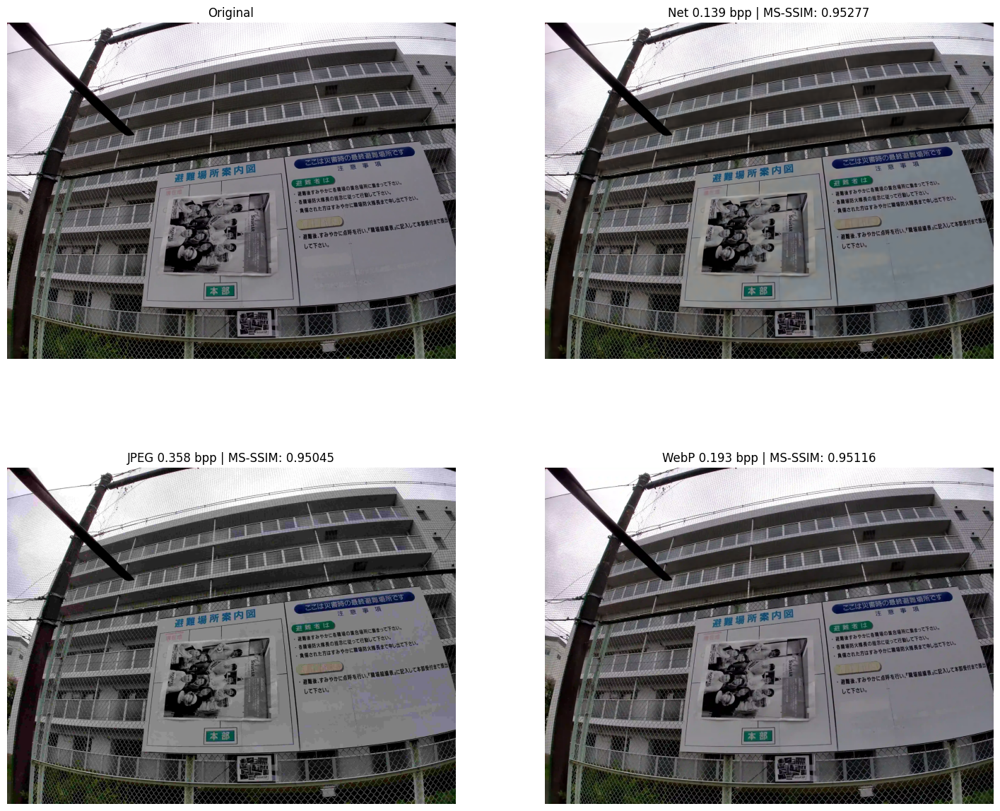

In [66]:
fig, axes = plt.subplots(2, 2, figsize=(18, 15))
for ax in axes.ravel():
    ax.axis('off')
    
axes[0][0].imshow(img)
axes[0][0].title.set_text('Original')
axes[0][1].imshow(rec_net)
axes[0][1].title.set_text(f'Net {target_bpp:.3f} bpp | MS-SSIM: {target_msssim:.5f}')
axes[1][0].imshow(rec_jpeg)
axes[1][0].title.set_text(f'JPEG {bpp_jpeg:.3f} bpp | MS-SSIM: {msssim_jpeg:.5f}')
axes[1][1].imshow(rec_webp)
axes[1][1].title.set_text(f'WebP {bpp_webp:.3f} bpp | MS-SSIM: {msssim_webp:.5f}')

plt.show()

## 3. Latent visualization

### Per-latent bit-rate results

In [68]:
def detailed_bpp(out):
    size = out['x_hat'].size()
    num_pixels = size[0] * size[2] * size[3]
    for name, values in out_net['likelihoods'].items():
        bpp_val = torch.log(values).sum() / (-math.log(2) * num_pixels)
        print(f'- "{name}" latent bit-rate: {bpp_val:.3f} bpp')
               
detailed_bpp(out_net)

- "y" latent bit-rate: 0.139 bpp


In [69]:
with torch.no_grad():
    y = net.g_a(x)
    y_hat, y_likelihoods = net.entropy_bottleneck(y)
    print(y.size(), y_likelihoods.size())

torch.Size([1, 192, 154, 205]) torch.Size([1, 192, 154, 205])


## Per channel estimated bit-rate

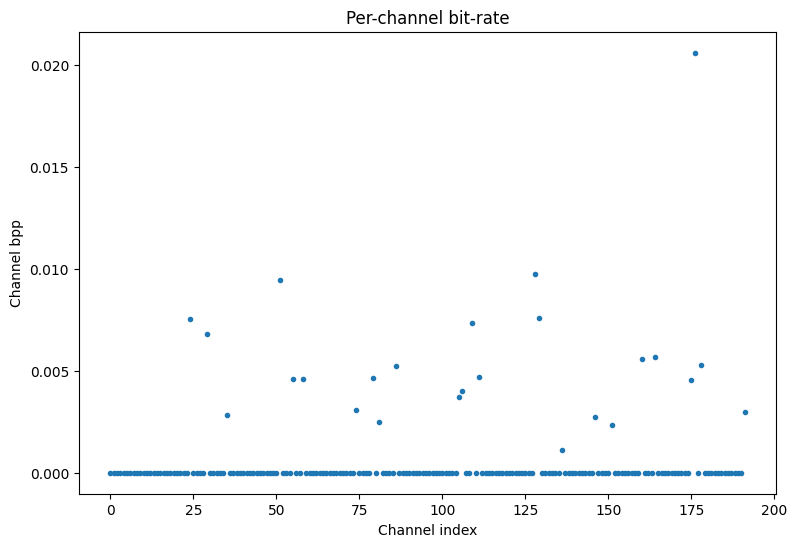

In [70]:
%matplotlib inline
num_pixels = x.size(2) * x.size(3)

channel_bpps = [torch.log(y_likelihoods[0, c]).sum().item() / (-math.log(2) * num_pixels)
                for c in range(y.size(1))]

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(channel_bpps, '.')
ax.title.set_text('Per-channel bit-rate')
ax.set_xlabel('Channel index')
ax.set_ylabel('Channel bpp')
plt.show()

### Order channels by bit-rates

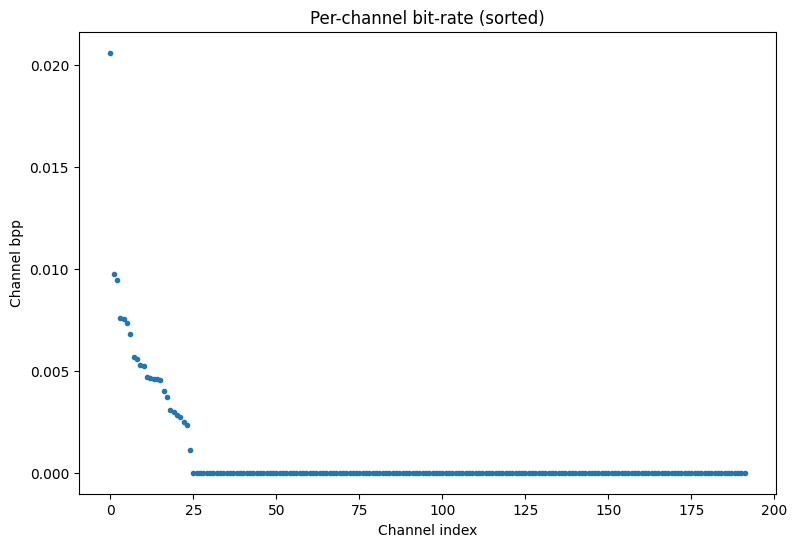

In [71]:
%matplotlib inline
num_pixels = x.size(2) * x.size(3)

ordered_idxs = torch.argsort(torch.Tensor(channel_bpps), descending=True)
ordered_channel_bpps = torch.Tensor(channel_bpps)[ordered_idxs]

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(ordered_channel_bpps, '.')
ax.title.set_text('Per-channel bit-rate (sorted)')
ax.set_xlabel('Channel index')
ax.set_ylabel('Channel bpp')
plt.show()

### Interactive per-channel visualization

In [72]:
from IPython.display import display, clear_output

In [73]:
%%capture
%matplotlib inline

fig, axes = plt.subplots(1, 2, figsize=(12, 9))
for ax in axes:
    ax.axis('off')

out = widgets.Output()
def show_channel(c):
    channel = y[0, ordered_idxs[c]].cpu()
    axes[0].imshow(channel)
    axes[0].title.set_text(f'Y | min: {channel.min():.2f} | max: {channel.max():.2f}')
    
    channel = y_hat[0, ordered_idxs[c]].cpu()
    axes[1].imshow(channel)
    axes[1].title.set_text(f'Yhat | min: {channel.min():.2f} | max: {channel.max():.2f}')
    with out:
        clear_output(wait=True)
        display(fig)

In [74]:
slider = widgets.IntSlider(min=0, max=y.size(1)-1, step=1,continuous_update=False, description='Channel idx')
slider.observe(lambda ev: show_channel(slider.value))
show_channel(0)
display(widgets.VBox([out, slider]))

## Quantized vs continuous latent

In [75]:
with torch.no_grad():
    x_hat_y = net.g_s(y).clamp_(0, 1)
    x_hat_y_hat = net.g_s(y_hat).clamp_(0, 1)

In [76]:
print('Decoded continuous latent:')
print(f'PSNR: {compute_psnr(x, x_hat_y):.2f}dB')
print(f'MS-SSIM: {compute_msssim(x, x_hat_y):.4f}')
print()
print('Decoded quantized latent:')
print(f'PSNR: {compute_psnr(x, x_hat_y_hat):.2f}dB')
print(f'MS-SSIM: {compute_msssim(x, x_hat_y_hat):.4f}')

Decoded continuous latent:
PSNR: 29.58dB
MS-SSIM: 0.9646

Decoded quantized latent:
PSNR: 28.20dB
MS-SSIM: 0.9528


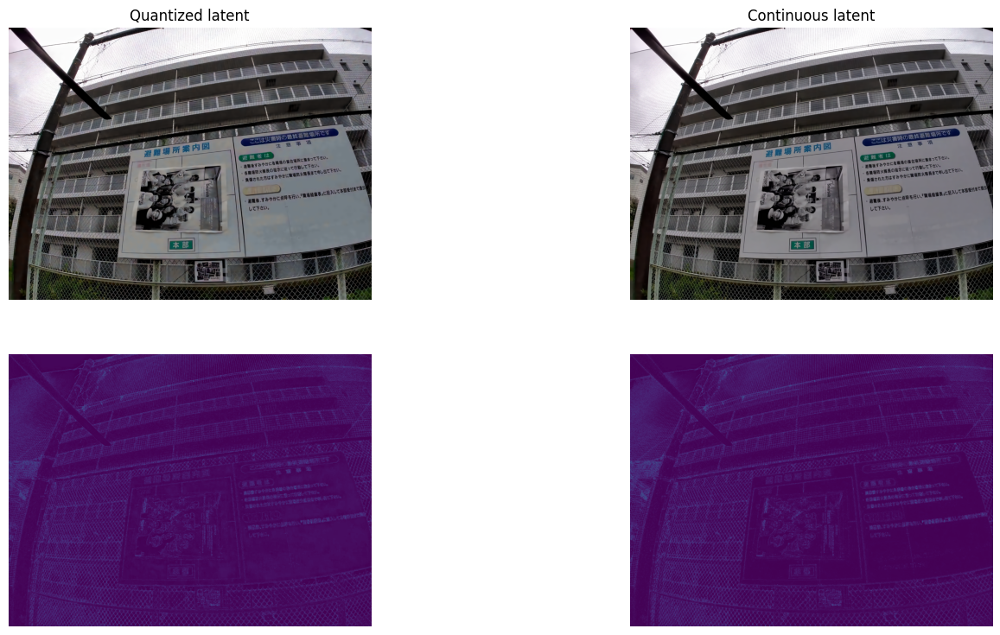

In [77]:
%matplotlib inline
fig, axes = plt.subplots(2, 2, figsize=(17, 9))
for ax in axes.ravel():
    ax.axis('off')
    
    axes[0][0].imshow(transforms.ToPILImage()(x_hat_y_hat.squeeze().cpu()))
    axes[0][0].title.set_text('Quantized latent')
    
    axes[1][0].imshow(torch.mean((x - x_hat_y_hat).abs(), axis=1).squeeze().cpu())
    
    axes[0][1].imshow(transforms.ToPILImage()(x_hat_y.squeeze()))
    axes[0][1].title.set_text('Continuous latent')
    
    axes[1][1].imshow(torch.mean((x - x_hat_y).abs(), axis=1).squeeze().cpu())

plt.show()